# PARTE 2. CREACIÓN DE VARIABLES

In [ ]:
!pip install pyphen

In [ ]:
!python -m spacy download es_core_news_sm

2024-01-18 18:36:03.421827: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-01-18 18:36:03.422023: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-01-18 18:36:03.426047: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-01-18 18:36:03.443522: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-01-18 18:36:05.621976: W tensorflow/compiler/tf2

In [ ]:
# Importamos las librerias que vamos a usar
import pandas as pd
import plotly.express as px
import pyphen
import networkx as nx
import matplotlib.pyplot as plt
import pandas as pd
import spacy
from nltk.tokenize import word_tokenize
from nltk import FreqDist
from scipy.stats import entropy
import seaborn as sns

# CARGA DATASET

In [ ]:
# Para trabajar con el archivo .csv creado en la anterior parte usamos el siguiente código

# Especificamos la ruta de tu archivo CSV
ruta_archivo_csv = '/content/df_poemas_lista_final.csv'

# Cargamos el archivo CSV en un DataFrame
df = pd.read_csv(ruta_archivo_csv)

# Mostramos el DataFrame
df

,autor,titulo,poema
0,damaso alonso,cómo era,"\nLa puerta, franca.\nVino queda y suave.\nNi ..."
1,damaso alonso,soneto sobre la libertad humana,"\nQué hermosa eres, libertad. No hay nada\nque..."
2,damaso alonso,petición del alma eterna,"\nAlma no eterna\n¡Ah, Señor! ¡Si tú existes!\..."
3,damaso alonso,amor,\n¡Primavera feroz! Va mi ternura\npor las más...
4,damaso alonso,la madre,"\nNo me digas\nque estás llena de arrugas, que..."
...,...,...,...
495,vicente aleixandre,vida,\n un pájaro de papel en el pecho\n...
496,vicente aleixandre,reposo,\n Una tristeza del tamaño de un pájaro...
497,vicente aleixandre,no existe el hombre,\n Sólo la luna sospecha la verdad.\n ...
498,vicente aleixandre,los besos,"\n no te olvides, temprana, de los ..."


In [ ]:
# Contamos el número de poemas por autor
conteo_por_autor = df.groupby('autor').size().reset_index(name='Numero_de_Poemas')

# Mostramos el resultado del conteo
print("\nNúmero de poemas por autor:")
print(conteo_por_autor)


Número de poemas por autor:
                   autor  Numero_de_Poemas
0          damaso alonso                50
1          emilio prados                50
2  federico garcía lorca                50
3          gerardo diego                50
4          jorge guillen                50
5           luis cernuda                50
6    manuel altolaguirre                50
7          pedro salinas                50
8         rafael alberti                50
9     vicente aleixandre                50


In [ ]:
# Verificamos que no hay valores nulos en el DataFrame
valores_nulos = df.isnull().sum()
print(valores_nulos)

autor     0
titulo    0
poema     0
dtype: int64


# CREACIÓN VARIABLE 3.1

In [ ]:
###### Variable 3.1 - Número de versos por estrofa en cada poema según autor

# Creamos una Función para contar versos por estrofa en un poema dado

def contar_versos_por_estrofa(poema):
    """
    Función que dada un objeto de tipo texto con formato de poema devuelve una lista que
    representa el número de versos, en cada estrofa.
    La posición inicial de la lista es la primera estrofa y su valor el número de versos.

    :param poema: texto poema
    :type poema: string
    :return: list
    :rtype: int
    """
    # Usaremos una estructura List comprehension.
    # Las estrofas se marcan en el texto mediante \n\n de modo que usamos la función split('\n\n')
    # especificando como delimitador el doble salto de línea
    # Fuente: https://python-reference.readthedocs.io/en/latest/docs/str/split.html
    # Por medio de el condicional -if estrofa.strip()- verificamos si la estrofa, después de eliminar
    # los espacios en blanco al principio y al final, no es una cadena vacía.
    # Después cada estrofa la dividimos según los saltos de línea; es decir, usando estrofa.strip().split('\n')
    # lo que nos dará los versos en cada estrofa
    # Usamos la función strip() para eliminar los espacios en blanco al principio y al final.
    estrofas = [estrofa.strip().split('\n') for estrofa in poema.split('\n\n') if estrofa.strip()]
    num_lineas_por_estrofa = [len(estrofa) for estrofa in estrofas]

    return num_lineas_por_estrofa

# Agregamos la columna versos_por_estrofa al dataFrame
df['versos_por_estrofa'] = df['poema'].apply(contar_versos_por_estrofa)

# Mostramos el DataFrame con la nueva columna que hemos calculado
df[['autor', 'titulo', 'versos_por_estrofa', 'poema']]

,autor,titulo,versos_por_estrofa,poema
0,damaso alonso,cómo era,"[5, 4, 3, 3]","\nLa puerta, franca.\nVino queda y suave.\nNi ..."
1,damaso alonso,soneto sobre la libertad humana,"[4, 4, 3, 3]","\nQué hermosa eres, libertad. No hay nada\nque..."
2,damaso alonso,petición del alma eterna,"[8, 6, 6, 2]","\nAlma no eterna\n¡Ah, Señor! ¡Si tú existes!\..."
3,damaso alonso,amor,"[4, 4, 3, 3]",\n¡Primavera feroz! Va mi ternura\npor las más...
4,damaso alonso,la madre,"[5, 5, 10, 7, 9, 8, 6, 8, 17, 22]","\nNo me digas\nque estás llena de arrugas, que..."
...,...,...,...,...
495,vicente aleixandre,vida,[12],\n un pájaro de papel en el pecho\n...
496,vicente aleixandre,reposo,"[4, 3, 3, 2]",\n Una tristeza del tamaño de un pájaro...
497,vicente aleixandre,no existe el hombre,"[2, 7, 14, 9, 4]",\n Sólo la luna sospecha la verdad.\n ...
498,vicente aleixandre,los besos,"[4, 4, 4, 4, 4]","\n no te olvides, temprana, de los ..."


In [ ]:
# Crear la columna "numero_total_estrofas"
df['numero_total_estrofas'] = df['versos_por_estrofa'].apply(lambda x: len(x))

# Reorganizamos el orden de las columnas
df = df[['autor', 'titulo', 'poema', 'numero_total_estrofas', 'versos_por_estrofa']]

# Mostrar el DataFrame resultante
df

,autor,titulo,poema,numero_total_estrofas,versos_por_estrofa
0,damaso alonso,cómo era,"\nLa puerta, franca.\nVino queda y suave.\nNi ...",4,"[5, 4, 3, 3]"
1,damaso alonso,soneto sobre la libertad humana,"\nQué hermosa eres, libertad. No hay nada\nque...",4,"[4, 4, 3, 3]"
2,damaso alonso,petición del alma eterna,"\nAlma no eterna\n¡Ah, Señor! ¡Si tú existes!\...",4,"[8, 6, 6, 2]"
3,damaso alonso,amor,\n¡Primavera feroz! Va mi ternura\npor las más...,4,"[4, 4, 3, 3]"
4,damaso alonso,la madre,"\nNo me digas\nque estás llena de arrugas, que...",10,"[5, 5, 10, 7, 9, 8, 6, 8, 17, 22]"
...,...,...,...,...,...
495,vicente aleixandre,vida,\n un pájaro de papel en el pecho\n...,1,[12]
496,vicente aleixandre,reposo,\n Una tristeza del tamaño de un pájaro...,4,"[4, 3, 3, 2]"
497,vicente aleixandre,no existe el hombre,\n Sólo la luna sospecha la verdad.\n ...,5,"[2, 7, 14, 9, 4]"
498,vicente aleixandre,los besos,"\n no te olvides, temprana, de los ...",5,"[4, 4, 4, 4, 4]"


In [ ]:
df_agrupado = df.groupby(['autor', 'numero_total_estrofas']).size().reset_index(name='count')
df_agrupado['numero_total_estrofas'] = df_agrupado['numero_total_estrofas'].astype(str)
color_discrete_map = {
    '1': 'red',
    '2': 'blue',
    '3': 'yellow',
    '4': 'green',
    '5': 'purple',
    '6': 'orange',
    '7': 'pink',
    '8': 'brown',
    '9': 'gray',
    '10': 'cyan',
    '11': 'lime',
    '12': 'magenta',
    '13': 'olive',
    '14': 'indigo',
    '15': 'teal',
    '16': 'violet',
    '17': 'coral',
    '18': 'gold',
    '19': 'navy',
    '20': 'tan',
    '21': 'salmon',
    '22': 'turquoise',
    '23': 'maroon',
    '24': 'slategray',
}

fig = px.bar(df_agrupado, x='autor', y='count', color='numero_total_estrofas',
             color_discrete_map=color_discrete_map,
             title='Número de Poemas en función del Total de Estrofas en cada Poema',
             labels={'numero_total_estrofas': 'Total de Estrofas por Poema', 'count': 'Número de Poemas'})

# Mostramos el gráfico
fig.show()

In [ ]:
# Agrupamos por autor y numero_total_estrofas, contamos el número de poemas en cada grupo
df_agrupado = df.groupby(['autor', 'numero_total_estrofas']).size().reset_index(name='count')

# Convertimos el 'numero_total_estrofas' a cadena (str)
df_agrupado['numero_total_estrofas'] = df_agrupado['numero_total_estrofas'].astype(str)

# Definimos un diccionario de colores
color_discrete_map = {
    '1': 'red',
    '2': 'blue',
    '3': 'yellow',
    '4': 'green',
    '5': 'purple',
    '6': 'orange',
    '7': 'pink',
    '8': 'brown',
    '9': 'gray',
    '10': 'cyan',
    '11': 'lime',
    '12': 'magenta',
    '13': 'olive',
    '14': 'indigo',
    '15': 'teal',
    '16': 'violet',
    '17': 'coral',
    '18': 'gold',
    '19': 'navy',
    '20': 'tan',
    '21': 'salmon',
    '22': 'turquoise',
    '23': 'maroon',
    '24': 'slategray',
}

# Creamos el gráfico de barras agrupado con Plotly Express
fig = px.bar(df_agrupado, x='numero_total_estrofas', y='count', color='numero_total_estrofas',
             color_discrete_map=color_discrete_map,
             title='Distribución de Poemas por Autor en función del Total de Estrofas',
             labels={'numero_total_estrofas': 'Total de Estrofas por Poema', 'count': 'Número de Poemas'},
             facet_col='autor', facet_col_wrap=4)

# Mostramos el gráfico
fig.show()



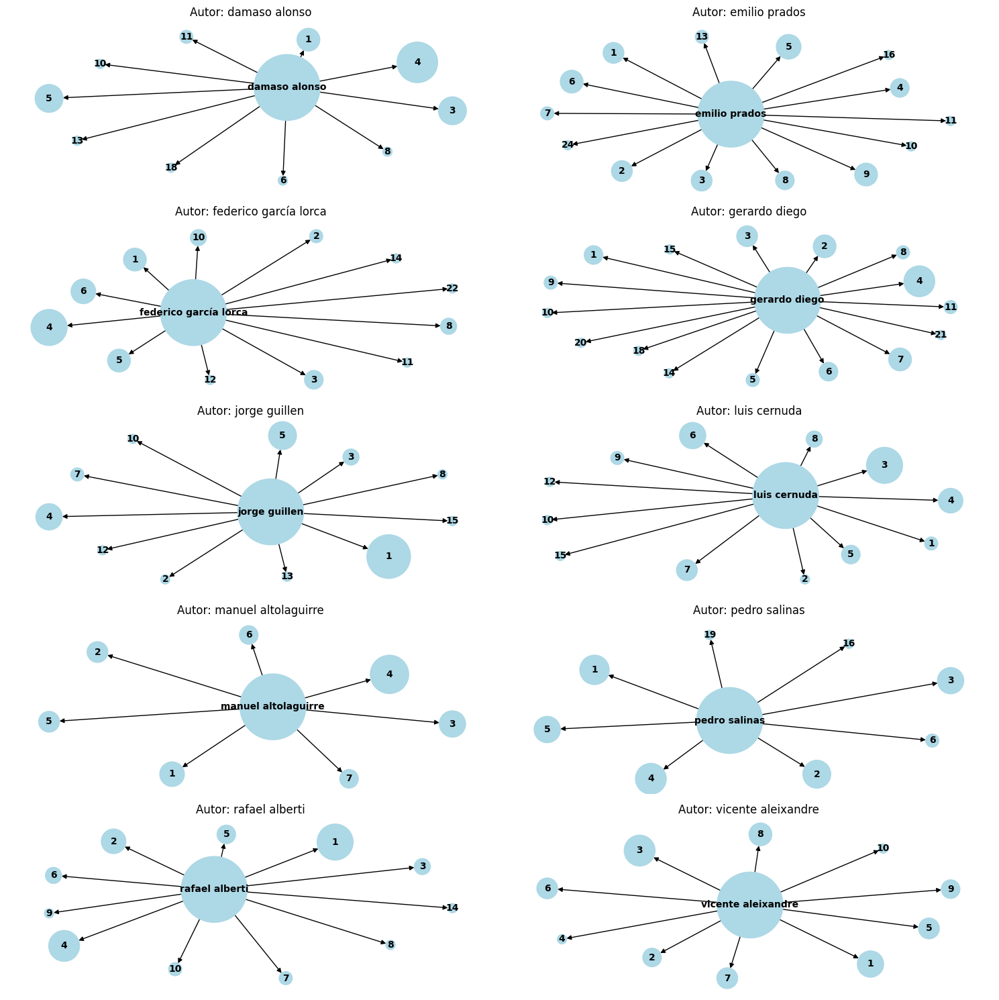

In [ ]:
# Para cada autor representamos como nodo central su nombre y el tamaño de los nodos está en función del número de poemas que tiene
# con un número dado de estrofas. Por ejemplo, los nodos 1 simbolizan los poemas con una estrofa, los nodos 4 poemas con 4 estrofas ...
# Si un autor tiene muchos poemas de 4 estrofas el tamaño de ese nodo será más grande en comparación con los otros nodos.

# Especificamos el número de filas y columnas en la cuadrícula
num_filas = 5
num_columnas = 2

# Creamos un grafo dirigido
G = nx.DiGraph()

# Obtenemos la lista de autores únicos
autores = df['autor'].unique()

# Creamos subplots y ajustamos el tamaño
fig, axs = plt.subplots(num_filas, num_columnas, figsize=(15, 15))

# Iteramos sobre cada autor y creamos un gráfico para cada uno
for i, autor in enumerate(autores):
    # Filtramos el DataFrame por autor
    df_autor = df[df['autor'] == autor]

    # Agregamos nodos y aristas al grafo para el autor actual
    for total_estrofas in df_autor['numero_total_estrofas'].unique():
        G.add_node(autor)
        G.add_node(total_estrofas)
        G.add_edge(autor, total_estrofas, weight=df_autor[df_autor['numero_total_estrofas'] == total_estrofas]['titulo'].nunique())

    # Obtenemos tamaños para los nodos
    node_sizes = [G.degree(node, weight='weight') * 100 for node in G.nodes]

    # Disposición de nodos
    pos = nx.spring_layout(G)

    # Dibujamos el grafo en el subplot correspondiente
    ax = axs[i // num_columnas, i % num_columnas]
    nx.draw(G, pos, with_labels=True, font_weight='bold', node_color='lightblue', node_size=node_sizes, font_size=10, ax=ax)
    ax.set_title(f'Autor: {autor}')

    # Limpiamos el grafo para el siguiente autor
    G.clear()

# Ajustamos el diseño de los subplots
plt.tight_layout()
plt.show()

In [ ]:
# Usando la función explode() de la librería pandas convertimos la variable versos_por_estrofa cuyos valores son lista de listas a una lista simple lo que nos permitirá usar la librería Plotly Express sobre
# sus valores
# Fuente: https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.explode.html
df_long = df.explode('versos_por_estrofa')

# Creamos un gráfico de barras con Plotly Express
# Fuente: https://plotly.com/python/plotly-express/
fig = px.bar(df_long, x='autor', y='versos_por_estrofa', color='titulo',
             title='Recuento de versos por Estrofa por Autor y Poema',
             labels={'versos_por_estrofa': 'Número de versos por Estrofa', 'autor': 'Autor'})

# Desactivamos la leyenda
fig.update_layout(showlegend=False)

# Mostramos el gráfico donde cada columna representa un autor y cada uno de sus poema tiene asociado un color y cada estrofa tiene un tamaño en función del número de versos que lo componen
# En el eje Y se muestra el recuento total de versos_por_estrofa de todos los poemas para cada autor
fig.show()

# CREACIÓN VARIABLE 3.2

In [ ]:
###### Variable 3.2 - Número de sílabas por estrofa en cada poema según autor

# Usamos la biblioteca pyphen para dividir las palabras en sílabas. Para ellos configuramos diccionario en español
# Fuente: https://pyphen.org/

diccionario_espanol = pyphen.Pyphen(lang='es')

# Creamos una función para contar sílabas en una línea-verso
def contar_silabas_verso(verso):
    """
    Función que dada una cadena de texto en español devuelve el número de sílabas

    :param linea: texto verso
    :type linea: string
    :return: número de sílabas por verso
    :rtype: int
    """
    # Por medio de verso.split dividimos en palabras la cadena de texto introducida en la función y por medio de diccionario_espanol.inserted(word)
    # dividimos por sílabas cada palabra. Por medio de la función len() obtenemos el total de sílabas de cada palabra. La función sum() nos dará la suma total
    # de los valores para cada palabra.
    return sum(len(diccionario_espanol.inserted(word).split('-')) for word in verso.split())

# Creamos una copia del dataframe
df = pd.DataFrame(df).copy()

# Agregamos la columna 'resultados' al DataFrame
df['resultados'] = df.apply(lambda row: {row['autor']: {row['titulo']: {num_versos: {'silabas': [contar_silabas_verso(verso) for verso in poema.split('\n') if contar_silabas_verso(verso) > 0],
                                                                                     'versos_por_estrofa': len([verso for verso in poema.split('\n') if contar_silabas_verso(verso) > 0])}
                                                                        for num_versos, poema in enumerate(row['poema'].split('\n\n'), start=1)}}}, axis=1)

# Convertimos la columna 'resultados' a un diccionario combinado
resultados_finales = {}

for resultados in df['resultados']:
    for autor, poemas in resultados.items():
        if autor in resultados_finales:
            for titulo, estrofas in poemas.items():
                if titulo in resultados_finales[autor]:
                    for num_versos, info_estrofa in estrofas.items():
                        resultados_finales[autor][titulo][num_versos] = info_estrofa
                else:
                    resultados_finales[autor][titulo] = estrofas
        else:
            resultados_finales[autor] = poemas

# Reorganizamos la estructura del diccionario y excluimos versos con ceros relativas a saltos de versos
for autor, poemas in resultados_finales.items():
    for titulo, estrofas in poemas.items():
        resultados_finales[autor][titulo] = {num_versos: estrofas[num_versos] for num_versos in estrofas if estrofas[num_versos]}

# Creamos un DataFrame adicional con la información de sílabas y versos por estrofa para cada poema según autor
data_estrofas = []
for autor, poemas in resultados_finales.items():
    for titulo, estrofas in poemas.items():
        for num_versos, info_estrofa in estrofas.items():
            data_estrofas.append({'autor': autor, 'titulo': titulo,'estrofa': num_versos, 'versos_por_estrofa': info_estrofa['versos_por_estrofa'],'silabas_por_verso': info_estrofa['silabas']})

df_estrofas = pd.DataFrame(data_estrofas)

# Mostramos el dataframe resultante
print("\nDataFrame de estrofas:")
df_estrofas


DataFrame de estrofas:


,autor,titulo,estrofa,versos_por_estrofa,silabas_por_verso
0,damaso alonso,cómo era,1,5,"[5, 6, 9, 11, 10]"
1,damaso alonso,cómo era,2,4,"[11, 12, 10, 13]"
2,damaso alonso,cómo era,3,3,"[11, 11, 11]"
3,damaso alonso,cómo era,4,3,"[12, 12, 11]"
4,damaso alonso,soneto sobre la libertad humana,1,4,"[13, 10, 12, 11]"
...,...,...,...,...,...
2334,vicente aleixandre,amor del cielo,2,5,"[18, 16, 24, 13, 14]"
2335,vicente aleixandre,amor del cielo,3,4,"[21, 16, 16, 15]"
2336,vicente aleixandre,amor del cielo,4,3,"[15, 11, 17]"
2337,vicente aleixandre,amor del cielo,5,5,"[12, 17, 14, 16, 16]"


In [ ]:
# Analizamos el número de promedio de estrofas, versos por estrofa y promedio de sílabas por autor
# Creamos la columna promedio_silabas_por_verso calculando el valor promedio de los valores de cada lista incluida en la columna 'silabas_por_verso'
df_estrofas['promedio_silabas_en_los_versos_de_las_estrofas'] = df_estrofas['silabas_por_verso'].apply(lambda x: sum(x) / len(x) if x else 0)

# Agrupamos los datos por autor y calculamos los valores asociados a la mediana para las variables de -estrofa-, -versos_por_estrofa y promedio_silabas_por_verso
df_promedios = df_estrofas.groupby('autor').agg({'estrofa': 'median', 'versos_por_estrofa': 'median', 'promedio_silabas_en_los_versos_de_las_estrofas': 'median'}).reset_index()

# Creamos el gráfico de puntos con líneas entre los puntos
fig = px.scatter(df_promedios, x='autor', y=['estrofa', 'versos_por_estrofa', 'promedio_silabas_en_los_versos_de_las_estrofas'],
                 title='Promedios por Autor para numero_estrofas, versos_por_estrofa, silabas_de_los_versos_por_estrofas',
                 labels={'value': 'Promedio', 'variable': 'Variable', 'autor': 'Autor'},
                 color_discrete_map={'estrofa': 'red', 'versos_por_estrofa': 'green', 'promedio_silabas_en_los_versos_de_las_estrofas': 'blue'})

# Cambiamos la etiqueta de la leyenda para 'estrofa' por 'numero_estrofas'
fig.update_traces(name='numero_estrofas', selector=dict(name='estrofa'))

# Mostramos el gráfico
fig.show()

In [ ]:
# Creamos el gráfico de caja para la distribución del número de versos por estrofa
fig_distribucion_lineas_por_estrofa = px.box(df_estrofas.explode('versos_por_estrofa'),
                                              x='autor', y='versos_por_estrofa', title='Distribución del Número de versos por Estrofa en todos los poemas',
                                              labels={'autor': 'Autor', 'titulo': 'titulo','versos_por_estrofa': 'Número de versos por Estrofa'})

# Mostramos el gráfico
fig_distribucion_lineas_por_estrofa.show()

In [ ]:
# Agrupamos el dataframe por autor, título y estrofa
grupo_estrofas = df_estrofas.groupby(['autor', 'titulo', 'estrofa'])

# Creamos un diccionario para almacenar los resultados
diccionario_resultados = {}

# Iteramos sobre los grupos que estamos considerando
for (autor, titulo, estrofa), grupo in grupo_estrofas:
    # Recogemos la información de silabas por verso
    silabas_por_verso = grupo['silabas_por_verso'].values[0]

    # Agregamos la información al diccionario de resultados
    diccionario_resultados.setdefault((autor, titulo), {})[estrofa] = silabas_por_verso

# Creamos un DataFrame que tendrá en una columna esta información de sílabas por estrofa para cada poema según autor
data_estrofas_agrupado = []
for (autor, titulo), estrofas in diccionario_resultados.items():
    # Combinamos los resultados en una sola columna llamada distribucion_silabas_estrofas
    data_estrofas_agrupado.append({'autor': autor, 'titulo': titulo, 'distribucion_silabas_estrofas': estrofas})

df_estrofas_agrupado = pd.DataFrame(data_estrofas_agrupado)

# Mostramos el DataFrame resultante
print("\nDataFrame de estrofas agrupado:")
df_estrofas_agrupado[['autor', 'titulo', 'distribucion_silabas_estrofas']].head(5)


DataFrame de estrofas agrupado:


,autor,titulo,distribucion_silabas_estrofas
0,damaso alonso,a los que van a nacer,"{1: [6, 12, 11, 11, 12, 10, 13, 15, 9, 13, 13,..."
1,damaso alonso,a un río le llamaban carlos,"{1: [8, 14, 19, 25], 2: [15, 18, 4, 12], 3: [1..."
2,damaso alonso,adiós al poeta rafael melero,"{1: [9, 9, 4, 9, 10, 5], 2: [9, 8, 5, 9, 10, 4..."
3,damaso alonso,amor,"{1: [12, 11, 13, 12], 2: [14, 13, 12, 12], 3: ..."
4,damaso alonso,burla,"{1: [8, 6, 6, 6], 2: [7, 8, 7, 8], 3: [7, 6, 6..."


# VARIABLE 3.3. ENTROPIA LÉXICA

In [ ]:
import nltk
nltk.download('punkt')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [ ]:
# Cargamos el modelo de lenguaje en español
nlp = spacy.load('es_core_news_sm')

# Creamos una función para filtrar palabras por partes del discurso (sustantivos y adjetivos) y presciendir de otras como prepopisciones y demás
def filtrar_sustantivos_adjetivos(texto):
    doc = nlp(texto)
    filtered_words = [token.lemma_ for token in doc if token.pos_ in ('NOUN', 'ADJ') and token.lemma_ not in nlp.Defaults.stop_words]
    return ' '.join(filtered_words)

# Aplicamos la función de filtrado a los textos
df['poema_filtrado_sust_adj'] = df['poema'].apply(filtrar_sustantivos_adjetivos)

# Creamos una función para calcular la entropía léxica de un texto
def calcular_entropia_lexica(texto):
    tokens = word_tokenize(texto)
    frecuencia_palabras = FreqDist(tokens)
    probabilidad_palabras = [freq / len(tokens) for freq in frecuencia_palabras.values()]
    entropia = entropy(probabilidad_palabras, base=2)
    return entropia

# Aplicamos la función de cálculo de entropía léxica a los textos filtrados
df['entropia_lexica_sust_adj'] = df['poema_filtrado_sust_adj'].apply(calcular_entropia_lexica)

# Mostramos la tabla resultante
df[['autor', 'titulo', 'entropia_lexica_sust_adj']]

,autor,titulo,entropia_lexica_sust_adj
0,damaso alonso,cómo era,4.789015
1,damaso alonso,soneto sobre la libertad humana,4.680758
2,damaso alonso,petición del alma eterna,4.343598
3,damaso alonso,amor,5.072140
4,damaso alonso,la madre,7.319657
...,...,...,...
495,vicente aleixandre,vida,4.852169
496,vicente aleixandre,reposo,4.754888
497,vicente aleixandre,no existe el hombre,6.004704
498,vicente aleixandre,los besos,5.208410


Distribución general de los valores de la variable


In [ ]:
# Análisis Descriptivo
print(df['entropia_lexica_sust_adj'].describe())

# Visualización de la Distribución con Plotly Express
fig = px.histogram(df, x='entropia_lexica_sust_adj', nbins=20, marginal='rug')
fig.update_layout(
    title='Distribución de Entropía Lexica',
    xaxis_title='Entropía Lexica',
    yaxis_title='Frecuencia'
)
fig.show()


count    500.000000
mean       4.676412
std        1.065250
min        1.000000
25%        4.038712
50%        4.700440
75%        5.319307
max        7.910078
Name: entropia_lexica_sust_adj, dtype: float64


Distribución de los valores de la variable por autor

In [ ]:
# Creamos el gráfico de puntos para la distribución de la entropía léxica por autor
fig_entropia_lexica = px.scatter(df, x='autor', y='entropia_lexica_sust_adj', title='Distribución de la Entropía Léxica por Autor',
                                 labels={'autor': 'Autor', 'entropia_lexica_sust_adj': 'Entropía Léxica'},
                                 color='autor')

# Mostramos el gráfico
fig_entropia_lexica.show()


Estadísticos de la distribución

In [ ]:
# Creamos el gráfico de caja para la distribución de la entropía léxica por autor según la entropia de sus poemas
fig_entropia_lexica = px.box(df, x='autor', y='entropia_lexica_sust_adj', title='Distribución de la Entropía Léxica por Autor',
                              labels={'autor': 'Autor', 'entropia_lexica_sust_adj': 'Entropía Léxica'},
                              color='autor')
# Mostramos el gráfico
fig_entropia_lexica.show()

Correlación con otras variables

In [ ]:
# Creamos el gráfico de puntos con facetas para cada uno de los autores
fig = px.scatter(df, x='numero_total_estrofas', y='entropia_lexica_sust_adj', color='autor',
                 title='Entropía Lexica por Número Total de Estrofas y Autor',
                 labels={'numero_total_estrofas': 'Número Total de Estrofas', 'entropia_lexica_sust_adj': 'Entropía Lexica'},
                 color_discrete_sequence=px.colors.qualitative.Set1,
                 facet_col='autor', facet_col_wrap=5, facet_col_spacing=0.1,
                 width=1500, height=750)

# Añadimos el título del poema como información adicional en cada punto
fig.update_traces(customdata=df['titulo'], hovertemplate='%{customdata}<br>' +
                  'Número Total de Estrofas: %{x}<br>' +
                  'Entropía Lexica: %{y}<br><br>')

# Ajustamos el diseño
fig.update_layout(title_text='Entropía Lexica por Número Total de Estrofas y Autor', showlegend=False)

# Mostramos el gráfico
fig.show()



In [ ]:
fig = px.bar(df,
             x='numero_total_estrofas',
             y='entropia_lexica_sust_adj',
             color='entropia_lexica_sust_adj',
             title='Entropía Lexica por Número Total de Estrofas y Autor',
             labels={'numero_total_estrofas': 'Número Total de Estrofas', 'entropia_lexica_sust_adj': ''},
             color_continuous_scale='Viridis',
             facet_col='autor',
             facet_col_wrap=3,
             height=800,
             width=1000,
             category_orders={'autor': df['autor'].unique()},
             template='plotly_dark',
             opacity=0.8)

# Ajustemos el diseño
fig.update_layout(
    showlegend=False,
    coloraxis_colorbar=dict(title='Entropía Lexica'),
)

# Ocultamos las líneas y etiquetas del eje y
fig.update_yaxes(showline=False, showgrid=False, showticklabels=False)

# Mostramos el gráfico
fig.show()




Entropía por estrofas para cada poema de cada autor

In [ ]:
# Función para dividir el poema en estrofas y calcular la entropía por estrofa
def calcular_entropia_por_estrofa(poema):
    estrofas = [estrofa.strip() for estrofa in poema.split('\n\n') if estrofa.strip()]
    entropias_por_estrofa = []

    for estrofa in estrofas:
        tokens = word_tokenize(estrofa)
        frecuencia_palabras = FreqDist(tokens)
        probabilidad_palabras = [freq / len(tokens) for freq in frecuencia_palabras.values()]
        entropia = entropy(probabilidad_palabras, base=2)
        entropias_por_estrofa.append(entropia)

    return entropias_por_estrofa

# Aplicar la función de cálculo de entropía por estrofa a los poemas
df['entropia_por_estrofa'] = df['poema'].apply(calcular_entropia_por_estrofa)

# Mostrar el DataFrame con las entropías por estrofa
df[['autor', 'titulo', 'entropia_por_estrofa']].head(5)

,autor,titulo,entropia_por_estrofa
0,damaso alonso,cómo era,"[4.375222374437916, 4.35729587384057, 4.095795..."
1,damaso alonso,soneto sobre la libertad humana,"[4.440223928941852, 4.506890595608518, 4.22987..."
2,damaso alonso,petición del alma eterna,"[5.276651172948498, 5.000167363234517, 5.26139..."
3,damaso alonso,amor,"[4.578780557638896, 4.2254973668028235, 3.7962..."
4,damaso alonso,la madre,"[4.771928094887365, 4.2430101595548555, 5.8740..."


In [ ]:
! pip install matplotlib seaborn


In [ ]:
# Aplanamos la columna 'entropia_por_estrofa'. Para ello usamos la función explode() se utiliza para descomponer las listas presentes en
# la columna 'entropia_por_estrofa', creando filas adicionales para cada elemento de la lista.
# En otras palabras, si tienes una lista de entropías por estrofa en una celda, explode expandirá esa celda en varias filas, cada una
# con una única entropía por estrofa.
# Fuente: https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.explode.html
df_entropia = df.explode('entropia_por_estrofa')

# Creamos el gráfico de líneas
fig = px.line(df_entropia, x=df_entropia.index, y='entropia_por_estrofa', color='autor',
              labels={'entropia_por_estrofa': 'Entropía por Estrofa', 'index': 'Índice de Estrofa'},
              title='Entropía por Estrofa para cada Poema del Autor')

# Mostramos el gráfico
fig.show()

¿Cómo sonarían?

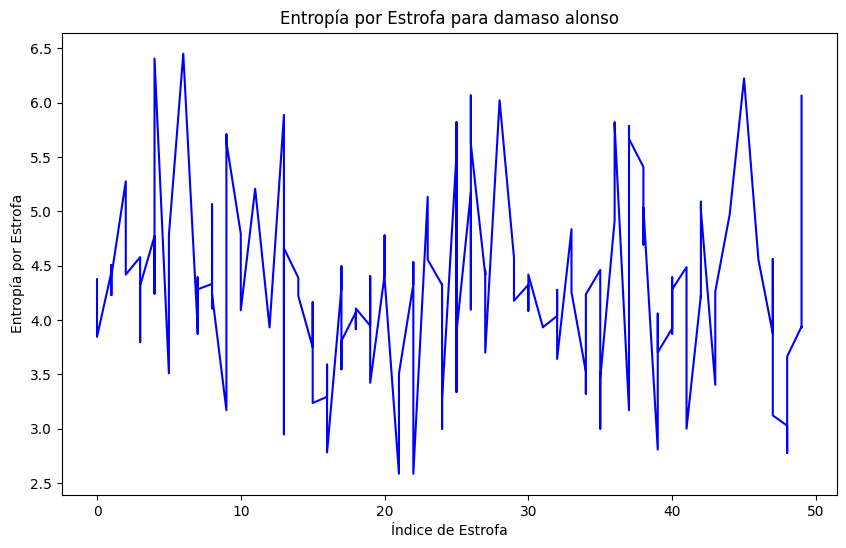

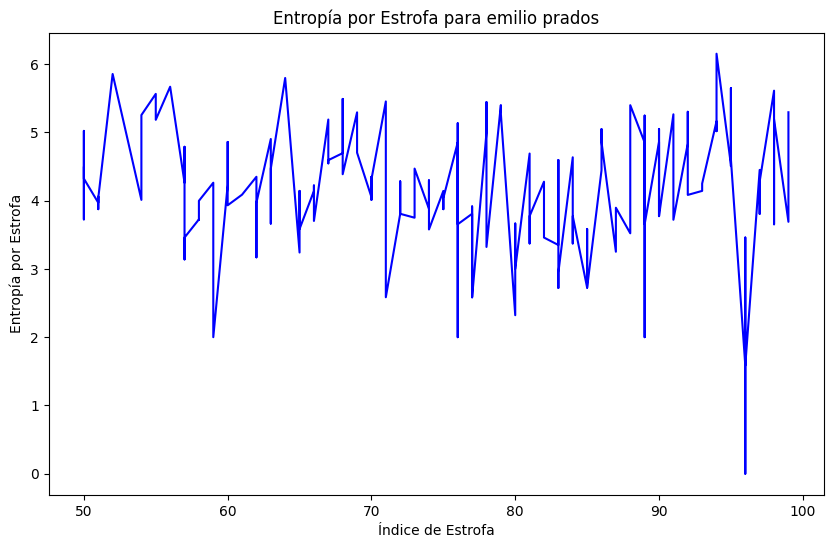

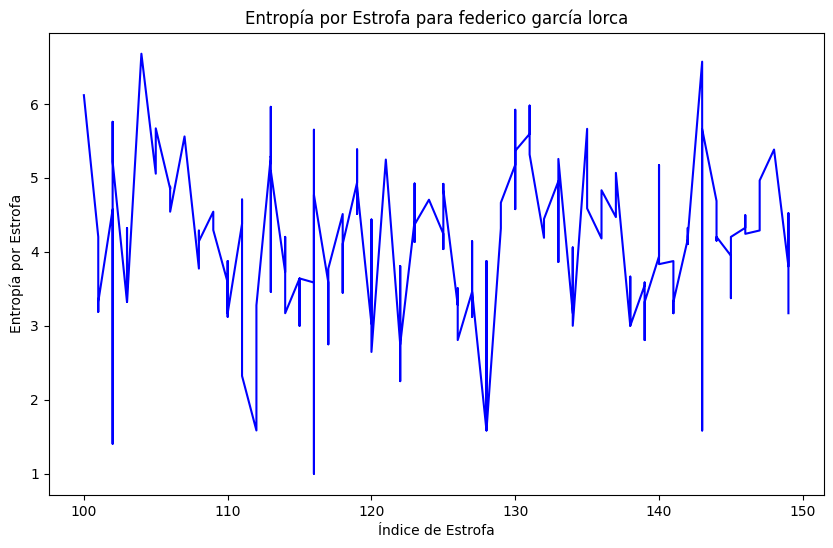

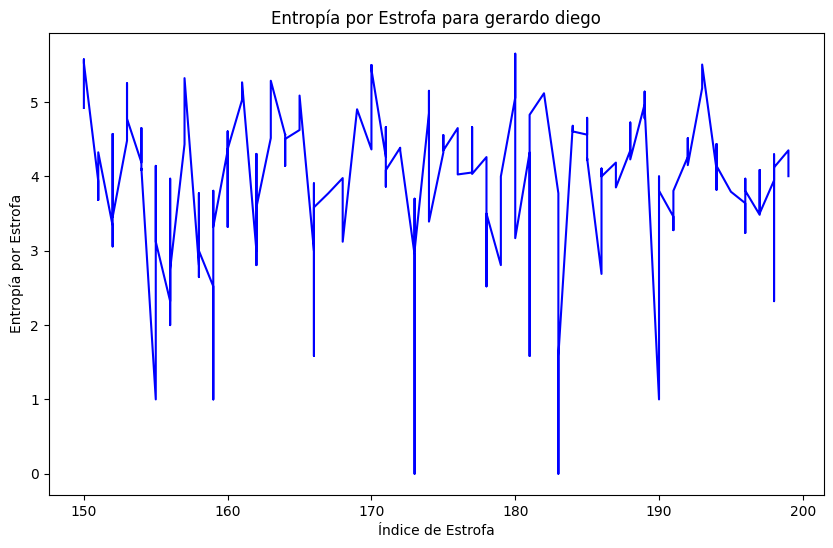

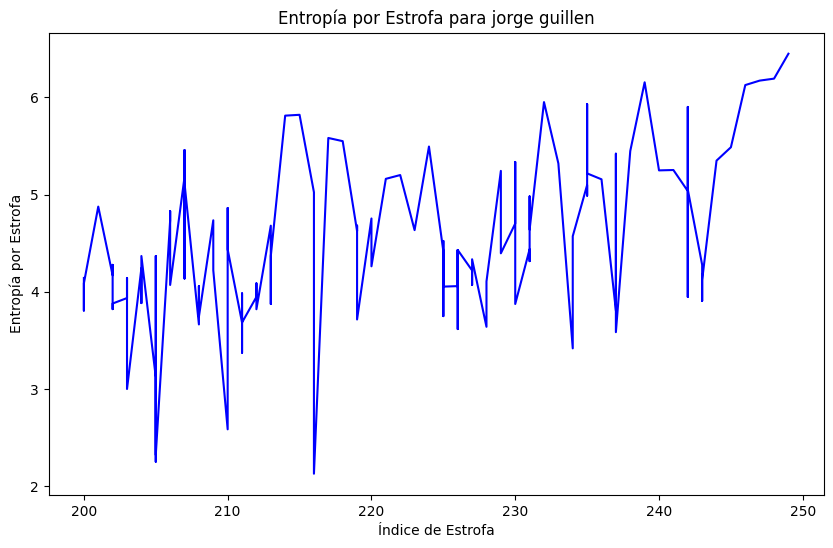

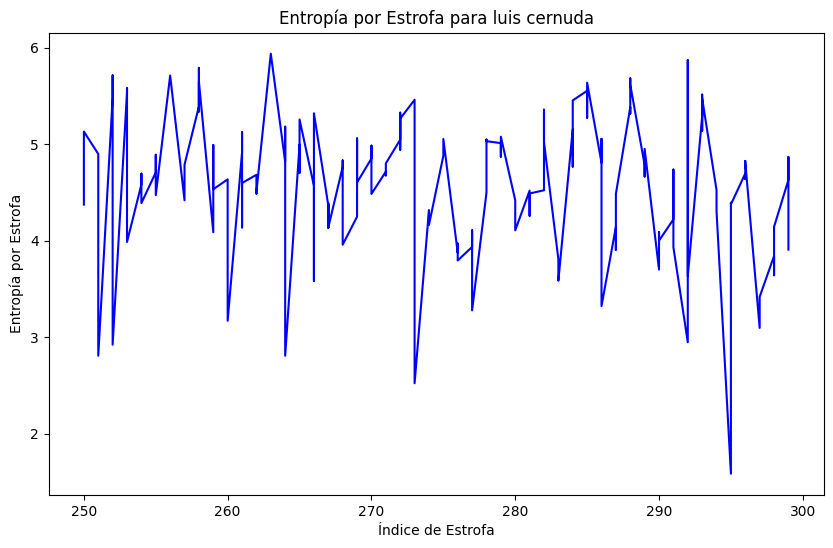

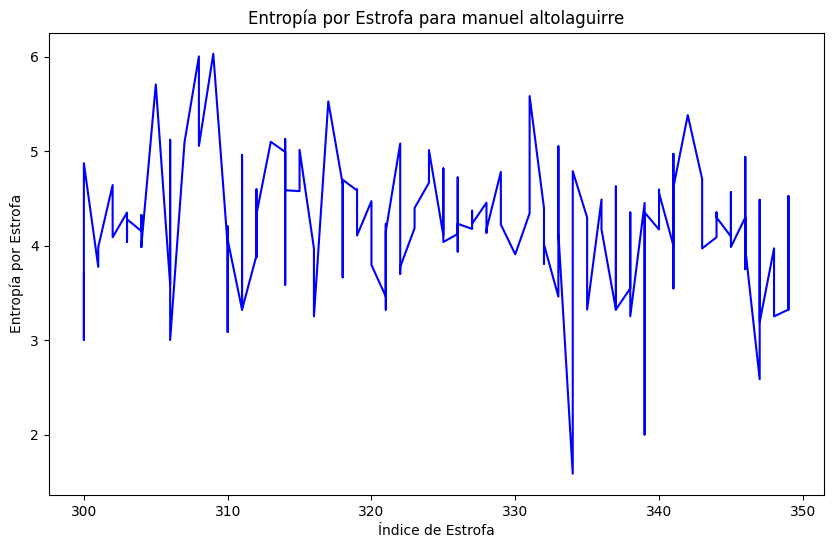

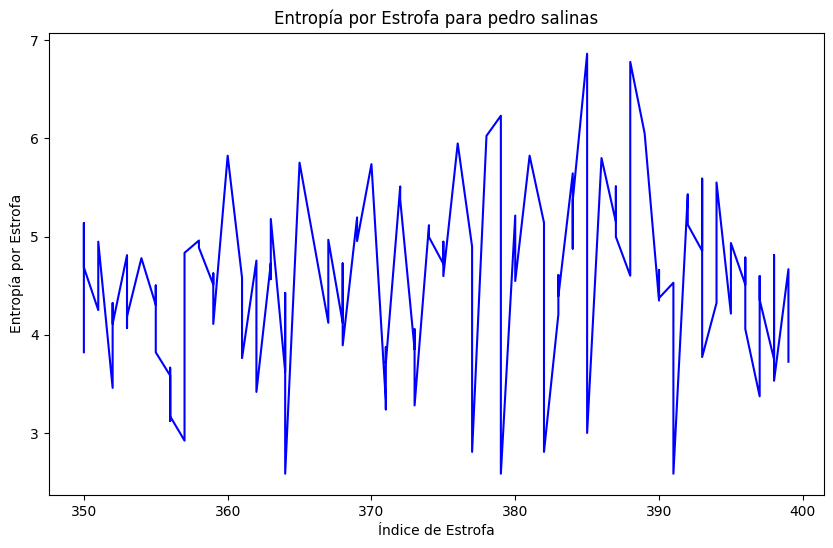

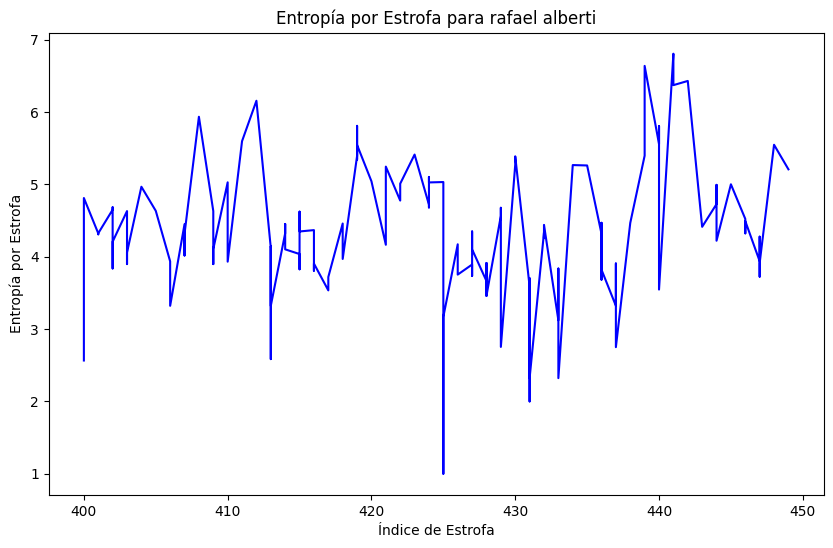

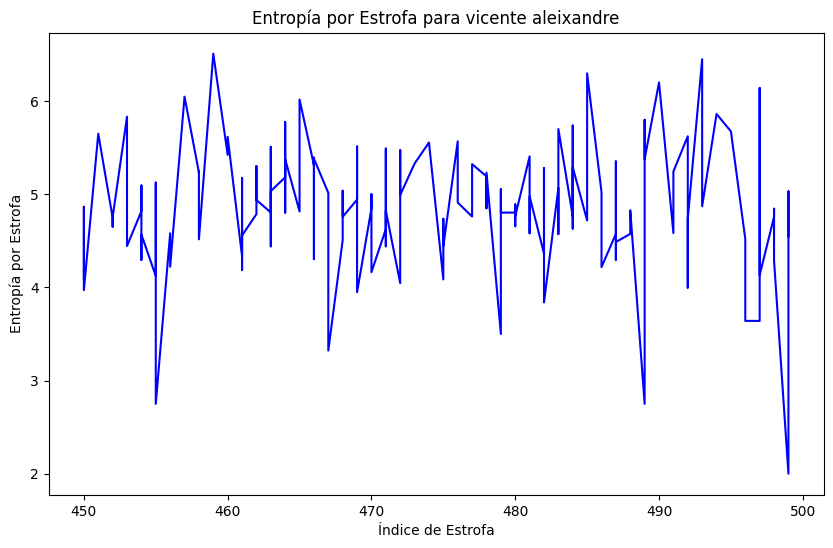

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.io.wavfile import write

# Datos del gráfico de líneas
x = df_entropia.index
y = df_entropia['entropia_por_estrofa']
color = df_entropia['autor']

# Configuramos los parámetros del sonido
sample_rate = 81100  # Frecuencia de muestreo en Hz
duration = 5  # Duración del sonido en segundos

# Generamos el sonido separado por autor
unique_authors = df_entropia['autor'].unique()
for author_id, author in enumerate(unique_authors):
    author_mask = (color == author)
    author_y = y[author_mask]

    # Normalizamos los datos de entropía para ajustarlos al rango del sonido
    normalized_y = (author_y - author_y.min()) / (author_y.max() - author_y.min())
    normalized_y = normalized_y * 2 - 1  # Ajustamos al rango [-1, 1]

    # Escalamos los datos a valores enteros para guardar el archivo WAV
    scaled_data = np.int16(normalized_y * 32767)

    # Generamos el sonido a partir de los datos escalados
    audio_data = np.zeros(duration * sample_rate)
    for i, val in enumerate(scaled_data):
        start_idx = int(i * duration / len(scaled_data) * sample_rate)
        end_idx = int((i + 1) * duration / len(scaled_data) * sample_rate)
        audio_data[start_idx:end_idx] = val

    # Guardamos el sonido en un archivo WAV con el nombre del autor
    write(f'{author}_audio.wav', sample_rate, audio_data)

    # Mostramos el gráfico de líneas para cada autor
    plt.figure(figsize=(10, 6))
    plt.plot(x[author_mask], author_y, color='blue')
    plt.title(f'Entropía por Estrofa para {author}')
    plt.xlabel('Índice de Estrofa')
    plt.ylabel('Entropía por Estrofa')
    plt.show()


In [ ]:
!pip install scipy

In [ ]:
from IPython.display import Audio
from scipy.io.wavfile import read

# Lista de autores en tu conjunto de datos
autores = df['autor'].unique()

# Directorio donde guardar los archivos de audio
directorio_audio = '/content/'


# Bucle for para cada autor
for autor in autores:
    # Obtener el nombre del autor en un formato adecuado para el nombre del archivo
    nombre_archivo = autor.replace(' ', ' ').lower()

    # Construir la ruta completa al archivo de audio del autor actual
    ruta_archivo_audio = f'{directorio_audio}{nombre_archivo}_audio.wav'

    # Leer el archivo WAV para obtener la tasa de muestreo y los datos
    rate, data = read(ruta_archivo_audio)

    # Imprimir información para depuración
    print(f'Nombre del archivo: {ruta_archivo_audio}')
    print(f'Tasa de muestreo: {rate}')
    print(f'Duración del audio: {len(data) / rate:.2f} segundos')

    # Reproducir el audio en el entorno de Google Colab
    display(Audio(data, rate=rate, embed=True))
    print(f'Reproduciendo tono para {autor}...')

Nombre del archivo: /content/damaso alonso_audio.wav
Tasa de muestreo: 81100
Duración del audio: 5.00 segundos


Reproduciendo tono para damaso alonso...
Nombre del archivo: /content/emilio prados_audio.wav
Tasa de muestreo: 81100
Duración del audio: 5.00 segundos


Reproduciendo tono para emilio prados...
Nombre del archivo: /content/federico garcía lorca_audio.wav
Tasa de muestreo: 81100
Duración del audio: 5.00 segundos


Reproduciendo tono para federico garcía lorca...
Nombre del archivo: /content/gerardo diego_audio.wav
Tasa de muestreo: 81100
Duración del audio: 5.00 segundos


Reproduciendo tono para gerardo diego...
Nombre del archivo: /content/jorge guillen_audio.wav
Tasa de muestreo: 81100
Duración del audio: 5.00 segundos


Reproduciendo tono para jorge guillen...
Nombre del archivo: /content/luis cernuda_audio.wav
Tasa de muestreo: 81100
Duración del audio: 5.00 segundos


Reproduciendo tono para luis cernuda...
Nombre del archivo: /content/manuel altolaguirre_audio.wav
Tasa de muestreo: 81100
Duración del audio: 5.00 segundos


Reproduciendo tono para manuel altolaguirre...
Nombre del archivo: /content/pedro salinas_audio.wav
Tasa de muestreo: 81100
Duración del audio: 5.00 segundos


Reproduciendo tono para pedro salinas...
Nombre del archivo: /content/rafael alberti_audio.wav
Tasa de muestreo: 81100
Duración del audio: 5.00 segundos


Reproduciendo tono para rafael alberti...
Nombre del archivo: /content/vicente aleixandre_audio.wav
Tasa de muestreo: 81100
Duración del audio: 5.00 segundos


Reproduciendo tono para vicente aleixandre...


# CREACIÓN DE UN DATAFRAME CON LAS VARIABLES CREADAS

In [ ]:
# Unimos df_estrofas_agrupado con df por medio del método merge
df_estrofas_agrupado_final = pd.merge(df_estrofas_agrupado, df[['autor', 'titulo', 'entropia_lexica_sust_adj']], on=['autor', 'titulo'], how='left')

In [ ]:
df_estrofas_agrupado_final

,autor,titulo,distribucion_silabas_estrofas,entropia_lexica_sust_adj
0,damaso alonso,a los que van a nacer,"{1: [6, 12, 11, 11, 12, 10, 13, 15, 9, 13, 13,...",5.998270
1,damaso alonso,a un río le llamaban carlos,"{1: [8, 14, 19, 25], 2: [15, 18, 4, 12], 3: [1...",5.776153
2,damaso alonso,adiós al poeta rafael melero,"{1: [9, 9, 4, 9, 10, 5], 2: [9, 8, 5, 9, 10, 4...",4.706891
3,damaso alonso,amor,"{1: [12, 11, 13, 12], 2: [14, 13, 12, 12], 3: ...",5.072140
4,damaso alonso,burla,"{1: [8, 6, 6, 6], 2: [7, 8, 7, 8], 3: [7, 6, 6...",4.368523
...,...,...,...,...
495,vicente aleixandre,unas pocas palabras,"{1: [6, 18, 20, 16, 21, 14, 14, 13, 12, 13, 16...",5.360902
496,vicente aleixandre,unidad en ella,"{1: [13, 12, 16, 15], 2: [14, 14, 17, 12], 3: ...",5.836714
497,vicente aleixandre,ven siempre ven,"{1: [20, 8, 16, 17, 14, 29], 2: [15, 18, 14, 1...",6.174614
498,vicente aleixandre,verdad siempre,"{1: [13, 10, 13, 12, 12, 12, 13, 12, 8], 2: [1...",4.582119


In [ ]:
# Merge de los DataFrames
df_merged = df_estrofas_agrupado_final.merge(df[['autor', 'poema', 'titulo', 'numero_total_estrofas','versos_por_estrofa']], on=['autor', 'titulo'], how='left')

# Eliminamos las filas duplicadas y conservamos solo la primera ocurrencia
df_merged_unique = df_merged.drop_duplicates(subset=['autor', 'titulo'], keep='first')

# Reorganizamos el orden de las columnas
df_poemas_final = df_merged_unique[['autor',	'titulo',	'poema','numero_total_estrofas','versos_por_estrofa', 'distribucion_silabas_estrofas', 'entropia_lexica_sust_adj']]

df_poemas_final.head(5)

,autor,titulo,poema,numero_total_estrofas,versos_por_estrofa,distribucion_silabas_estrofas,entropia_lexica_sust_adj
0,damaso alonso,a los que van a nacer,\n¡Cuán cerca todavía\nde las manos de Dios! ¿...,4,"[12, 11, 7, 8]","{1: [6, 12, 11, 11, 12, 10, 13, 15, 9, 13, 13,...",5.998270
1,damaso alonso,a un río le llamaban carlos,\nYo me senté en la orilla;\nquería preguntart...,8,"[4, 4, 8, 9, 10, 11, 7, 13]","{1: [8, 14, 19, 25], 2: [15, 18, 4, 12], 3: [1...",5.776153
2,damaso alonso,adiós al poeta rafael melero,"\n no hay que llorarte, melero.\n ...",5,"[6, 6, 6, 6, 1]","{1: [9, 9, 4, 9, 10, 5], 2: [9, 8, 5, 9, 10, 4...",4.706891
3,damaso alonso,amor,\n¡Primavera feroz! Va mi ternura\npor las más...,4,"[4, 4, 3, 3]","{1: [12, 11, 13, 12], 2: [14, 13, 12, 12], 3: ...",5.072140
4,damaso alonso,burla,"\npor las praderas hondas,\navizor y azoradas\...",3,"[4, 4, 4]","{1: [8, 6, 6, 6], 2: [7, 8, 7, 8], 3: [7, 6, 6...",4.368523


In [ ]:
# Exportamos el dataframe resultado a formato csv
df_poemas_final.to_csv('df_poemas_final.csv', index=False)